In [2]:
import numpy as np
import matplotlib.pyplot as plt
import os
import math
from astropy.io import fits
from astropy import units as u
from astropy.coordinates import SkyCoord
from PyAstronomy import pyasl
import wavelength_utils as wu


In [3]:
# read in raw spectra from NSDRP output
# and calculate RVs for each exposure

# order switch ('70' or '71')
order = '71'
# set telluric contamination factor
sky_fac = 2
# set planet name
plname = 'wasp44b'

# set directory containing fixed fits images
rawdir = "/Users/amelia/Desktop/PHYSICS199/nsdrp/" # AK
specdir = rawdir + "nsdrp_out/ascii/flux"
os.chdir(specdir)

# set phoenix model name
phoenix_fn = 'lte054-4.5-0.0a+0.0.BT-Settl.7' # AK

outdir = 'reduced_wlsol_'+order+'/'
specfilename = '{0}_spec_wlsol_order{1}_exp{2}.npy'
BJD_name = "BJDs_{0}.txt".format(plname)

# save final spectra in a separate directory
if os.path.isdir(rawdir+outdir) == False:
    os.mkdir(rawdir+outdir)

# system parameters
lat, lon, alt = 19.8260, -155.4747, 4145 # telescope location
radec = '00 15 36.7694526377 -11 56 17.286419043' # AK - change to wasp44 sky coordinates
sysvel = -4000 # system radial velocity (m/s) - Anderson+2018
t0 = 2459154.92778 # AK - change to WASP-44 mid-transit time (JD), NASA exo archive
P = 2.4238039 # AK - change to WASP44 planet orbital period (days) 
K = 138 # planet RV amplitude (m/s)
c = 299792458 # speed of light (m/s)

# convert coords to degrees
coords = SkyCoord(radec, unit=(u.hourangle, u.deg))
ra = coords.ra.degree
dec = coords.dec.degree
print('DONE')

DONE


In [6]:
# list all files in directory containing extracted spectra
flist = os.listdir( specdir )
# make empty arrays for lists of spectra and exposure numbers
speclist = []
rawlist = []
exp_num = []

# find all text files containing spectra, and the correct exposure numbers
for i in range( len(flist) ):
        if order+'_flux.txt' in flist[i]:
            speclist = np.append( speclist, flist[i] )
            rawlist = np.append( rawlist, flist[i][:16]+'.fits' )
            exp_num = np.append(exp_num, flist[i][12:16])
            
# sort lists by exposure numbers
exp_num = exp_num.astype(int)
speclist = speclist[np.argsort(exp_num)]
rawlist = rawlist[np.argsort(exp_num)]

print(speclist[0])
print(os.getcwd()) 
nexp = len(rawlist) # number of exposures
npix = len(np.genfromtxt(speclist[0], usecols=0, unpack=True)) # number of pixels in individual spectra

# open each fits file (in order) and extract each exposure mid-time
tcs = np.zeros( nexp )
for i in range( nexp ):
    hdul = fits.open(rawdir+rawlist[i])
    tcs[i] = hdul[0].header['MJD'] + 0.5*hdul[0].header['TRUITIME']/(24*60*60) + 2400000.5
print('Julian Dates:')
print(tcs)
np.save('WASP44JDS.npy', tcs) #save a numpy file

nspec201101_0291_fixed-2_fixed_71_flux.txt
/Users/amelia/Desktop/PHYSICS199/nsdrp/nsdrp_out/ascii/flux
Julian Dates:
[2459154.81946661 2459154.81970261 2459154.81989161 2459154.82012761
 2459154.8213645  2459154.8222625  2459154.8230885  2459154.8239735
 2459154.82681711 2459154.83082011 2459154.83463311 2459154.83850511
 2459154.84277911 2459154.84682811 2459154.85066511 2459154.85462011
 2459154.86008511 2459154.86402911 2459154.86785411 2459154.87173811
 2459154.87634211 2459154.88023811 2459154.88407411 2459154.88794711
 2459154.89250411 2459154.89638811 2459154.90022411 2459154.90417911
 2459154.90855911 2459154.91247911 2459154.91630411 2459154.92032911]


In [7]:
# write jd and spectra into big arrays
allspec = np.zeros([nexp, npix, 2])
#BJDs = np.genfromtxt(BJD_name)
BJDs = tcs # don't worry about BJD correction for now
rvs = np.zeros( nexp )

for i in range( nexp ):
    # extract each spectrum and save in big array
    obji, snri = np.genfromtxt( speclist[i], usecols=[2,5], unpack=True )
    allspec[i,:,0] = obji
    allspec[i,:,1] = obji / snri
    
    # correct for barycentric motion
    corr, bjd = pyasl.helcorr(lon, lat, alt, ra, dec, BJDs[i] )
    # calculate reflex motion of star
    reflex = K * math.sin( 2 * math.pi * ( t0 - BJDs[i] ) / P )
    # correct for total radial velocity of star
    rvs[i] =  sysvel + reflex - corr*1000

# make numpy save file of all spectra 
np.save('{0}_spectra_noshift_{1}.npy'.format(plname, order), allspec)
# make numpy save file of individual RVs
np.save('{0}_rvs.npy'.format(plname), rvs)
print('DONE')

DONE


/Users/amelia/Desktop/PHYSICS199/nsdrp/nsdrp_out/ascii/flux


Text(0.5, 1.0, 'stellar model (wasp44b)')

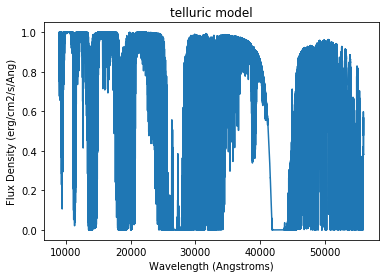

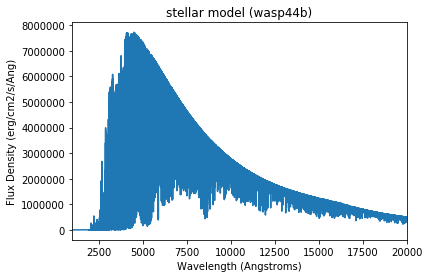

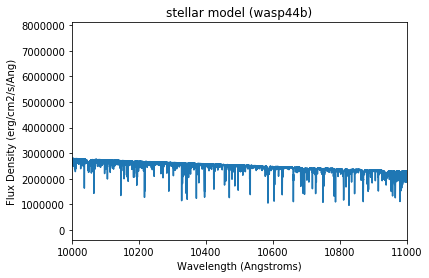

In [8]:
# begin wavelength solution
# get telluric spectrum

print(os.getcwd()) 
sky_fn = 'sky_spec_sample.txt'
skywl, skyfl = np.genfromtxt( sky_fn, unpack=True )
skywl_air = wu.vac2air(skywl*1e4)
plt.figure()
plt.plot(skywl_air, skyfl)
plt.xlabel('Wavelength (Angstroms)')
plt.ylabel('Flux Density (erg/cm2/s/Ang)')
plt.title('telluric model')

# set order limits
if order == '71':
    order_lims = [10000,12000] # A
    mod_lims = [10790,11000]
    

# import model phoenix spectrum 
lambda_star, fl_phoenix = np.genfromtxt(phoenix_fn, usecols=[0,1], unpack=True) # wavelength [A], flux [erg/s/cm2/A]
# sort fluxes by wavelength
fl_phoenix = fl_phoenix[np.argsort(lambda_star)]
lambda_star = np.sort(lambda_star)
mod_wl = wu.vac2air(lambda_star)
mod_fl = 10**(fl_phoenix-8)

plt.figure()
plt.plot(mod_wl, mod_fl)
plt.xlabel('Wavelength (Angstroms)')
plt.xlim(1000,20000)
plt.ylabel('Flux Density (erg/cm2/s/Ang)')
plt.title('stellar model ({0})'.format(plname))

plt.figure()
plt.plot(mod_wl, mod_fl)
plt.xlabel('Wavelength (Angstroms)')
plt.xlim(10000,11000)
plt.ylabel('Flux Density (erg/cm2/s/Ang)')
plt.title('stellar model ({0})'.format(plname))


In [9]:
# fitting functions
bounds = [ (1500,2100), (10890,10910), (150,250), (-5, 10), (-5,10), \
          (0.8,1.2), (-10,10), (-10,10), (-10,10), (-10,10) , (-10,10)]

def scale_col(col, n):
    return (col - n/2) / n

def cheby3(x, a0, a1, a2, a3):
    return a0 + a1*x + a2*(2*x**2 - 1) + a3*(4*x**3 - 3*x)

def cheby5(x, a0, a1, a2, a3, a4, a5):
    return a0 + a1*x + a2*(2*x**2 - 1) + a3*(4*x**3 - 3*x) + a4*(8*x**4 - 8*x**2 + 1) + a5*(16*x**5 - 20*x**3 + 5*x)

def chisq(pars, data, col, modwl, mod ):
    n, a0, a1, a2, a3, a0f, a1f, a2f, a3f, a4f, a5f = pars
    x = scale_col(col,n)
    guess_wls = cheby3(x, a0, a1, a2, a3)
    guess_cont = cheby5(x, a0f, a1f, a2f, a3f, a4f, a5f)
    delix  = np.arange(324,360)
    interpf = interpolate.interp1d( modwl, mod )
    fake_mod = interpf(guess_wls)

    guess_cont = np.delete(guess_cont,delix)
    guess_wls = np.delete(guess_wls,delix)
    fake_mod = np.delete(fake_mod,delix)
    data = np.delete(data,delix)

    ch = np.sum( (data/guess_cont - fake_mod)**2 )
    return ch

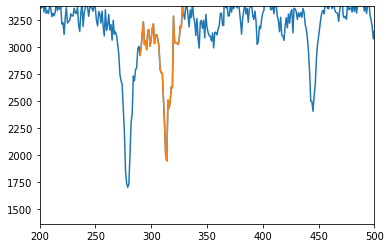

In [11]:
# fit wavelength solution for each exposure
# (add shifted telluric to individual stellar models)
# cut first and last 10 pixels from each spectrum because it gets weird there
# actually last half looks messed up
d = allspec[:,10:-50,:]
nexp, ncol, _ = np.shape(d)


# check I'm deleting correct He pixels for wl fit
delix  = np.arange(290,330)
expno = 10
plt.figure()
plt.plot(np.arange(len(d[expno,:,0])), d[expno,:,0] )
plt.plot(delix, d[expno,delix,0])
plt.xlim(200,500)
plt.ylim(np.min(d[expno,delix,0]*0.7), np.max(d[expno,delix,0]))
plt.show()

(0.65, 1.1)

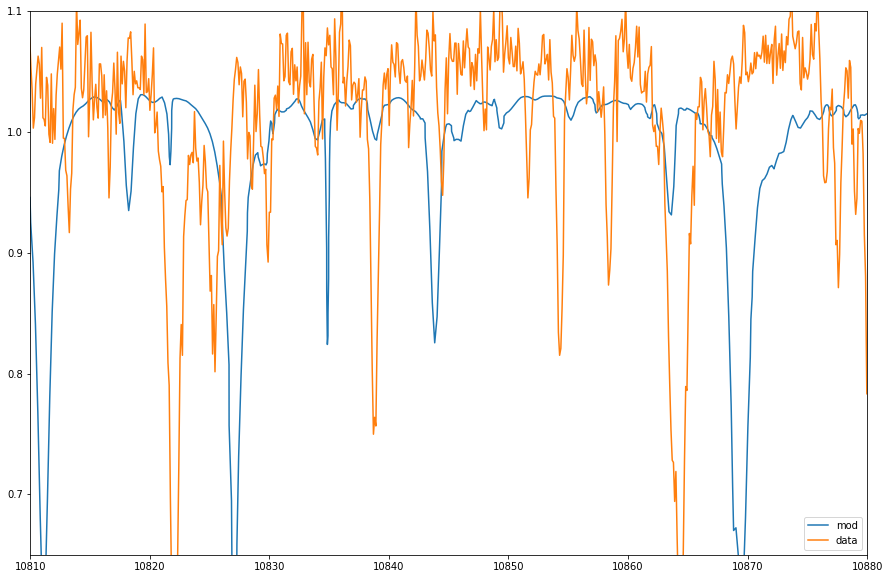

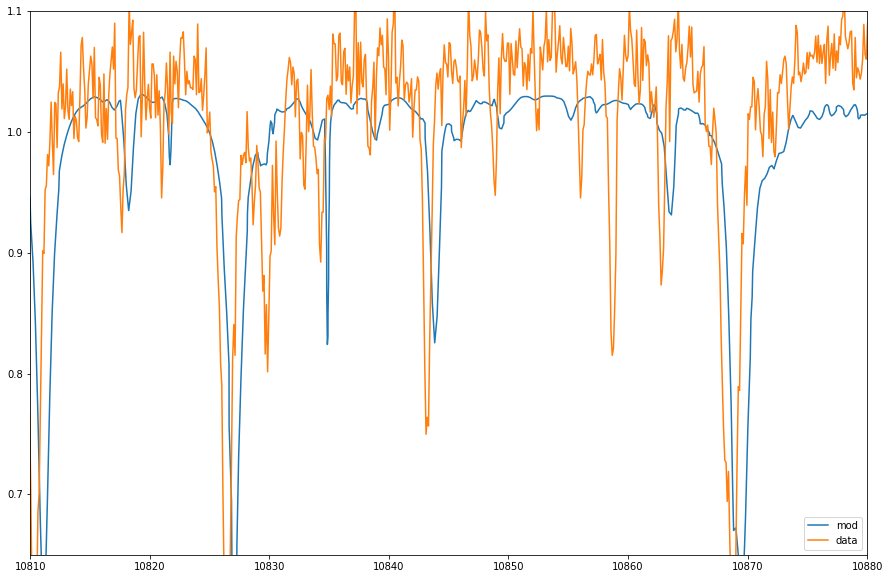

In [12]:
mod_fl = mod_fl[np.where((mod_wl>order_lims[0])*(mod_wl<order_lims[1]))[0]]
mod_wl = mod_wl[np.where((mod_wl>order_lims[0])*(mod_wl<order_lims[1]))[0]]


# attach spectrum to grating equation from WASP-107 and compare to model
from scipy import interpolate
from scipy.optimize import differential_evolution
import scipy.ndimage

w107n = "wasp107_spec_jan_stage2_exp44_labframe.npy"
w107 = np.load(w107n)

#dtest = np.load(specfilename.format(plname, order, 30))

shifted_skywl = wu.doppler(-1*rvs[0], skywl_air)
interpf_sky = interpolate.interp1d( shifted_skywl, skyfl , kind='cubic')
interped_sky = interpf_sky( mod_wl )
mod_n_sky = mod_fl+sky_fac*interped_sky-sky_fac

# set spectral resolution
R = 150000 # (clearly this is wrong but it seems to work)
spec_el = np.median(np.diff(mod_wl)) 
delwl = 10830./ R
pix_fwhm = delwl / spec_el
smooth_model = scipy.ndimage.filters.gaussian_filter1d( mod_n_sky, pix_fwhm )
smooth_model_nosky = scipy.ndimage.filters.gaussian_filter1d( mod_fl, pix_fwhm )
modmed = smooth_model/np.median(np.nan_to_num(smooth_model[(mod_wl>mod_lims[0])*(mod_wl<mod_lims[1])]))
modmed_nosky = smooth_model_nosky/np.median(np.nan_to_num(smooth_model_nosky[(mod_wl>mod_lims[0])*(mod_wl<mod_lims[1])]))

plt.figure(figsize=(15,10))
#plt.plot(mod_wl, modmed, label='mod+sky')
plt.plot(mod_wl, modmed, label='mod')
#plt.plot(mod_wl, modmed, label='mod+sky')
plt.plot(w107[:1840,0],d[i,:1840,0]/np.median(np.nan_to_num(d[i,:1840,0])),label='data')
plt.legend()
plt.xlim(10810,10880)
plt.ylim(0.65,1.10)

plt.figure(figsize=(15,10))
#plt.plot(mod_wl, modmed, label='mod+sky')
plt.plot(mod_wl, modmed, label='mod')
#plt.plot(mod_wl, modmed, label='mod+sky')
plt.plot(w107[:1840,0]+4.4,d[i,:1840,0]/np.median(np.nan_to_num(d[i,:1840,0])),label='data')
plt.legend()
plt.xlim(10810,10880)
plt.ylim(0.65,1.10)



In [ ]:
# for i in range(nexp):
#     print( 'preliminary wavelength soln {0} of {1}'.format(i+1, nexp))
#     medi = np.median(np.nan_to_num(d[i,:,0]))
#     datmed = d[i,:,0]/medi

#     # rv shift telluric spectra and add to stellar model
#     shifted_skywl = wu.doppler(-1*rvs[i], skywl_air)
#     interpf_sky = interpolate.interp1d( shifted_skywl, skyfl , kind='cubic')
#     interped_sky = interpf_sky( mod_wl )
#     mod_n_sky = mod_fl+sky_fac*interped_sky-sky_fac

#     # convolve with a gausian kernel to match resolution
#     spec_el = np.median(np.diff(mod_wl)) 
#     delwl = 10830./ R
#     pix_fwhm = delwl / spec_el
#     smooth_model = scipy.ndimage.filters.gaussian_filter1d( mod_n_sky, pix_fwhm )
#     modmed = smooth_model/np.median(np.nan_to_num(smooth_model[(mod_wl>mod_lims[0])*(mod_wl<mod_lims[1])]))
    
#     # fit
#     results = differential_evolution(chisq, bounds, args=(datmed, np.arange(ncol),mod_wl, modmed))
#     xcorr = scale_col(np.arange(ncol), results.x[0])
#     datcorr = datmed / cheby5(xcorr, results.x[5], results.x[6], results.x[7], results.x[8], results.x[9], results.x[10])
#     wlcorr = cheby3(xcorr, results.x[1], results.x[2], results.x[3], results.x[4]) 
#     datout = np.column_stack((wlcorr, datcorr, d[i,:,1]))
#     np.save(specfilename.format(plname, order, i), datout)

medis = np.zeros(nexp)
def doppler(rv, wl):
    return (wl*rv)/c + wl

for i in range(nexp):
    print( 'preliminary wavelength soln {0} of {1}'.format(i+1, nexp))
    medi = np.median(np.nan_to_num(d[i,:,0]))
    datmed = d[i,:,0]/medi
    # rv shift stellar spectra and add to telluric model
    shifted_modwl = doppler(rvs[i], mod_wl)
    interpf_mod = interpolate.interp1d( shifted_modwl, mod_fl , kind='cubic',bounds_error=False, fill_value=0)
    interped_mod = interpf_mod( skywl_air )
    interped_mod = interped_mod/np.nanmedian(interped_mod[(skywl_air>mod_lims[0])*(skywl_air<mod_lims[1])])
    mod_n_sky = interped_mod+sky_fac*skyfl-sky_fac
    # convolve with a gausian kernel to match resolution
    spec_el = np.median(np.diff(mod_wl))
    delwl = 10830./ R
    pix_fwhm = delwl / spec_el
    smooth_model = scipy.ndimage.filters.gaussian_filter1d( mod_n_sky, pix_fwhm )
    # fit
    results = differential_evolution(chisq, bounds, args=(datmed, np.arange(ncol),skywl_air, smooth_model))
    xcorr = scale_col(np.arange(ncol), results.x[0])
    datcorr = datmed / cheby5(xcorr, results.x[5], results.x[6], results.x[7], results.x[8], results.x[9], results.x[10])
    wlcorr = cheby3(xcorr, results.x[1], results.x[2], results.x[3], results.x[4])
    datout = np.column_stack((wlcorr, datcorr, d[i,:,1]))
    np.save(specfilename.format(plname, order, i), datout)

preliminary wavelength soln 1 of 32
preliminary wavelength soln 2 of 32
preliminary wavelength soln 3 of 32
preliminary wavelength soln 4 of 32
preliminary wavelength soln 5 of 32
preliminary wavelength soln 6 of 32
preliminary wavelength soln 7 of 32


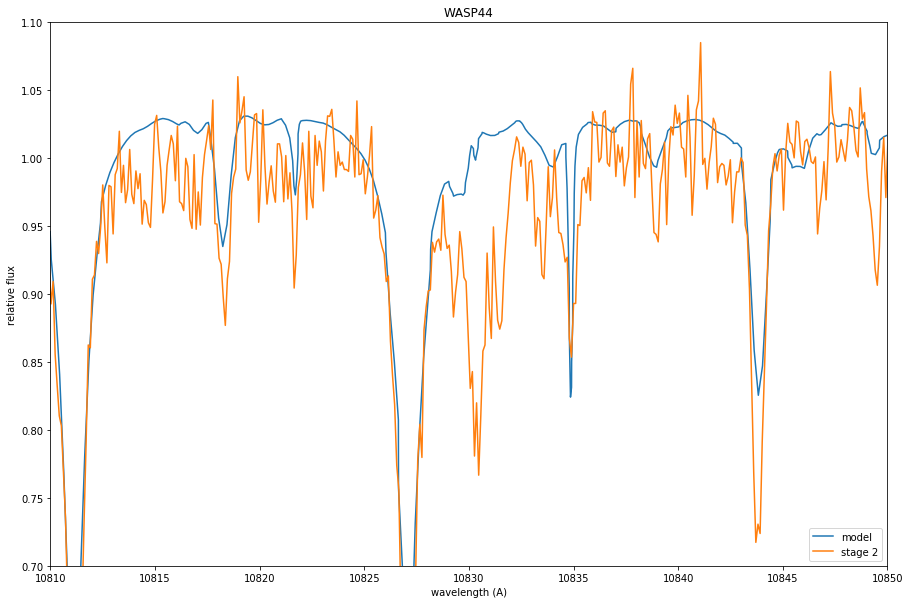

In [60]:
# check wavelength solution against model
import getmean_he
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML


fig = plt.figure(figsize=(15,10))
axis = plt.axes(xlim = (10810,10850), ylim = (0.7,1.1))
frame_num =np.arange(nexp)

line, = axis.plot([],[])
plt.xlabel('wavelength (A)')
plt.ylabel('relative flux')
plt.title('WASP44')


plotlays,plotcols = [2], ["tab:blue","tab:orange"]
lines = []


lobj = axis.plot([],[],color=plotcols[0],label='model')[0]
lines.append(lobj)
lobj = axis.plot([],[],color=plotcols[1],label='stage 2')[0]
lines.append(lobj)


def init():
    for line in lines:
        line.set_data([],[])
    return lines

x1,y1 = [],[]
x2,y2 = [],[]

def animate(i):
    idic = np.load(specfilename.format(plname, order, i))
    dx = idic[:,0]
    dy = idic[:,1] / getmean_he.main(idic[:,0],idic[:,1])

    xlist = [mod_wl,dx]
    ylist = [modmed_nosky,dy]

    labels = ['model', 'step2']


    for lnum,line in enumerate(lines):
        line.set_data(xlist[lnum], ylist[lnum])


    return lines

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=frame_num, interval=1000, blit=True)

plt.legend(loc="lower right")
HTML(anim.to_jshtml())

-116.49655709761917


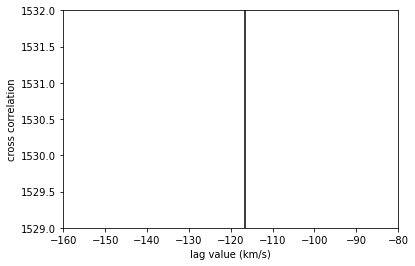

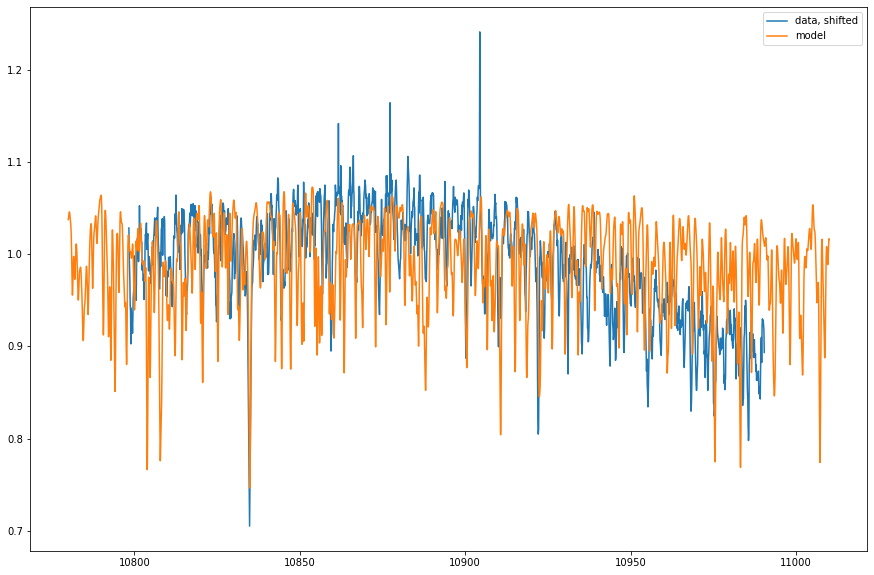

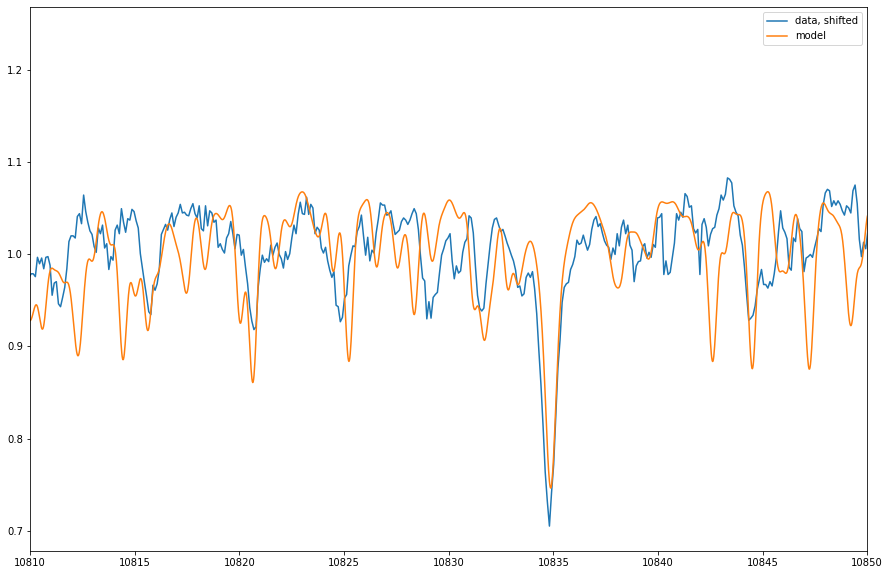

In [14]:
# the actual maximum doesn't work - but the second peak does
ixs2 = np.where(lag.value<-80)[0]
lag2 = lag.value[ixs2]
corr2 = corr[ixs2]

print(lag2[np.argmax(corr2)])

plt.plot(lag2,corr2)
plt.vlines(lag2[np.argmax(corr2)],0,np.max(corr2)*1.3)
plt.xlim(-160,-80)
plt.ylim(1529,1532)
plt.xlabel('lag value (km/s)')
plt.ylabel('cross correlation')

wl_dat_shifted2 = doppler(lag2[np.argmax(corr2)]*-1000, w107[:1840,0] )

plt.figure(figsize=(15,10))
plt.plot(wl_dat_shifted2, example, label='data, shifted')
plt.plot(modwl_cut, modmed_cut, label='model')
plt.legend()

plt.figure(figsize=(15,10))
plt.plot(wl_dat_shifted2, example, label='data, shifted')
plt.plot(modwl_cut, modmed_cut, label='model')
plt.xlim(10810,10850)
plt.legend()


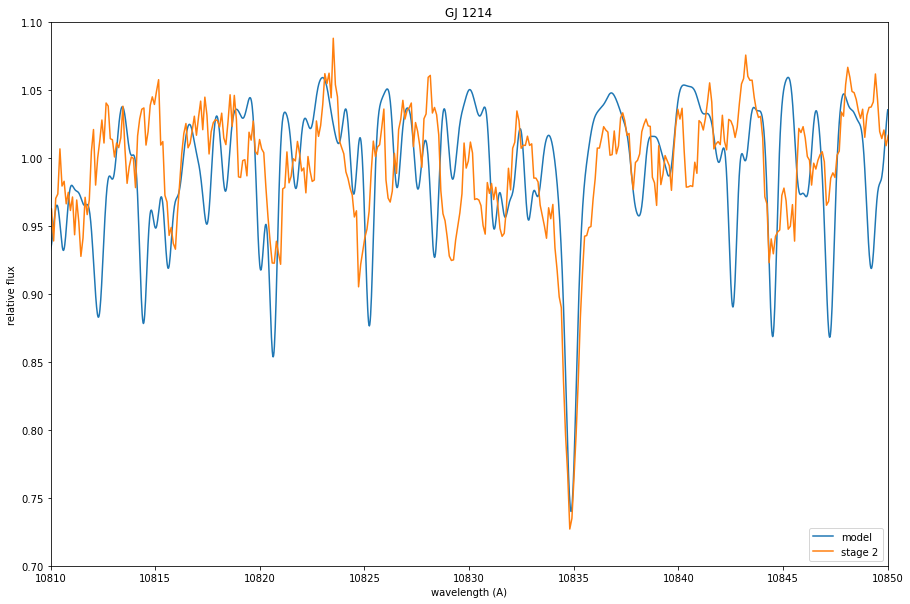

In [21]:
# check cross corr wavelength solution against model
fig = plt.figure(figsize=(15,10))
axis = plt.axes(xlim = (10810,10850), ylim = (0.7,1.1))
frame_num =np.arange(nexp)

line, = axis.plot([],[])
plt.xlabel('wavelength (A)')
plt.ylabel('relative flux')
plt.title('GJ 1214')


plotlays,plotcols = [2], ["tab:blue","tab:orange"]
lines = []


lobj = axis.plot([],[],color=plotcols[0],label='model')[0]
lines.append(lobj)
lobj = axis.plot([],[],color=plotcols[1],label='stage 2')[0]
lines.append(lobj)


def init():
    for line in lines:
        line.set_data([],[])
    return lines

x1,y1 = [],[]
x2,y2 = [],[]

def animate(i):
    idic = np.load(specfilename2.format(plname, order, i))
    dx = idic[:,0]
    dy = idic[:,1] / getmean_he.main(idic[:,0],idic[:,1])

    xlist = [mod_wl,dx]
    ylist = [modmed_nosky,dy]

    labels = ['model', 'step2']


    for lnum,line in enumerate(lines):
        line.set_data(xlist[lnum], ylist[lnum])


    return lines

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=frame_num, interval=1000, blit=True)

plt.legend(loc="lower right")
HTML(anim.to_jshtml())

In [100]:
#make in vs outspectrum
tmid =  2459154.92778 # 2459154.92778 JD midpoint
tdur = 0.0936 #in days???

t0 = tmid - 0.5*tdur
t4 = tmid + 0.5*tdur

pre = np.where(BJDs < t0)[0]
in_ixs = np.where((BJDs>t0)*(BJDs<t4))[0]

post = np.where(BJDs > t4)[0]
out_ixs = np.concatenate((pre,post))

print(in_ixs)
print(out_ixs)

print(len(in_ixs))

[22 23 24 25 26 27 28 29 30 31]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]
10


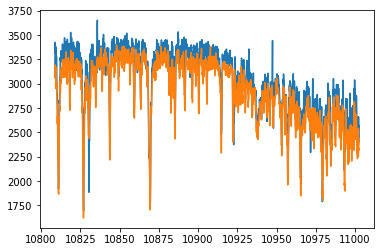

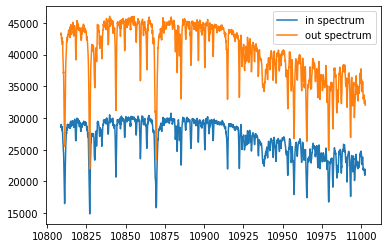

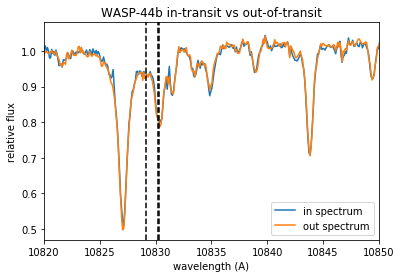

In [109]:
from scipy import interpolate
d0 = np.load(specfilename.format(plname, order, 0))
master_out = np.zeros(len(d0[:,0]))

allspec_resampled = np.zeros((len(d0[:,0]),nexp))
for i in range(nexp):
    di = np.load(specfilename.format(plname, order, i))
    interpf = interpolate.interp1d(di[:,0], di[:,1] , kind='cubic',\
                                   bounds_error=False, fill_value=0)
    interped = interpf( d0[:,0] )
    allspec_resampled[:,i] = interped

wl=d0[:,0]
plt.plot(wl,allspec_resampled[:,10])
plt.plot(wl,allspec_resampled[:,20])

inspec = np.zeros(len(d0[:,0]))
for i in range(len(in_ixs)):
    inspec = inspec+ allspec_resampled[:,in_ixs[i]]
    
outspec = np.zeros(len(d0[:,0]))
for i in range(len(out_ixs)):
    outspec = outspec+ allspec_resampled[:,out_ixs[i]]

plt.figure()
plt.plot(wl,inspec, label='in spectrum')
plt.plot(wl,outspec, label='out spectrum')
plt.legend()

inspecmean = inspec/getmean_he.main(wl, inspec)

outspecmean = outspec/getmean_he.main(wl, outspec)

plt.figure()
plt.plot(wl,inspecmean, label='in spectrum')
plt.plot(wl,outspecmean, label='out spectrum')
plt.legend()
plt.xlim(10820,10850)
plt.xlabel('wavelength (A)')
plt.ylabel('relative flux')
plt.title('WASP-44b in-transit vs out-of-transit')
xposition = [10829.09114, 10830.25010, 10830.33977]
for xc in xposition:
    plt.axvline(x=xc, color='k', linestyle='--')

output = np.column_stack((wl,inspec,outspec))
np.save('WASP44_in_out.npy', output)
